In [142]:
#All the necesasry libraries
import os                       
import numpy as np                
import pandas as pd               
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
%matplotlib inline
from fancyimpute import KNN
from scipy.stats import chi2_contingency
from math import radians, cos, sin, asin, sqrt
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import mean_absolute_error,mean_squared_error,explained_variance_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor


C:\Users\user\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [112]:
#Setting ther directory
os.chdir(r"C:\\Users\user\Downloads")
os.getcwd()

'C:\\Users\\user\\Downloads'

In [113]:
# Loading the train & test dataset
train = pd.read_csv("train_cab.csv")
test = pd.read_csv("test.csv")


In [114]:
print(train.describe()) #To analyse the satistical measures of variables


       pickup_longitude  pickup_latitude  dropoff_longitude  dropoff_latitude  \
count      16067.000000     16067.000000       16067.000000      16067.000000   
mean         -72.462787        39.914725         -72.462328         39.897906   
std           10.578384         6.826587          10.575062          6.187087   
min          -74.438233       -74.006893         -74.429332        -74.006377   
25%          -73.992156        40.734927         -73.991182         40.734651   
50%          -73.981698        40.752603         -73.980172         40.753567   
75%          -73.966838        40.767381         -73.963643         40.768013   
max           40.766125       401.083332          40.802437         41.366138   

       passenger_count  
count     16012.000000  
mean          2.625070  
std          60.844122  
min           0.000000  
25%           1.000000  
50%           1.000000  
75%           2.000000  
max        5345.000000  


In [115]:
print(train.info()) #Information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16067 entries, 0 to 16066
Data columns (total 7 columns):
fare_amount          16043 non-null object
pickup_datetime      16067 non-null object
pickup_longitude     16067 non-null float64
pickup_latitude      16067 non-null float64
dropoff_longitude    16067 non-null float64
dropoff_latitude     16067 non-null float64
passenger_count      16012 non-null float64
dtypes: float64(5), object(2)
memory usage: 878.7+ KB
None


In [116]:
train.shape #Dimensions of the dataset

(16067, 7)

Splitting the 'pickup_datetime' variable into "hour", "day of the week", "date","month" and "year" respectively 

In [117]:
#Function to split the 'pickup_datetime' variable
def split_datetime(df):
    df['pickup_datetime']  = pd.to_datetime(df['pickup_datetime'],errors='coerce')
    df['Year']= df['pickup_datetime'].apply(lambda x: x.year)
    df['Month']= df['pickup_datetime'].apply(lambda x: x.month)
    df['Date']= df['pickup_datetime'].apply(lambda x: x.day)
    df['Day_of_Week'] = df['pickup_datetime'].apply(lambda x: x.dayofweek)
    df['Hour']= df['pickup_datetime'].apply(lambda x: x.hour)  
    df=df.drop('pickup_datetime',axis=1)
    return df



#Applying the function into train & test dataset
train = split_datetime(train)
test = split_datetime(test)

In [92]:
pd.options.display.max_rows=None # to display all the rows
train

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Month,Date,Day_of_Week,Hour
0,4.50,-73.844311,40.721319,-73.841610,40.712278,1.00,2009,6,15,0,17
1,16.90,-74.016048,40.711303,-73.979268,40.782004,1.00,2010,1,5,1,16
2,5.70,-73.982738,40.761270,-73.991242,40.750562,2.00,2011,8,18,3,0
3,7.70,-73.987130,40.733143,-73.991567,40.758092,1.00,2012,4,21,5,4
4,5.30,-73.968095,40.768008,-73.956655,40.783762,1.00,2010,3,9,1,7
5,12.10,-74.000964,40.731630,-73.972892,40.758233,1.00,2011,1,6,3,9
6,7.50,-73.980002,40.751662,-73.973802,40.764842,1.00,2012,11,20,1,20
7,16.50,-73.951300,40.774138,-73.990095,40.751048,1.00,2012,1,4,2,17
8,NaN,-74.006462,40.726713,-73.993078,40.731628,1.00,2012,12,3,0,13
9,8.90,-73.980658,40.733873,-73.991540,40.758138,2.00,2009,9,2,2,1


In [118]:
##Fare amount can't be any value less than or equal to 0

train['fare_amount'] = pd.to_numeric(train['fare_amount'], errors='coerce')# changing the datatype of 'fare_amount'


#function to remove observations <=0
def fare_amount(df):
    df = df.drop( (df[ df['fare_amount'] < 1]).index, axis=0)
    return df



#Applying the function into train dataset
train['fare_amount'] = fare_amount(train)


In [119]:
#Passenger Count can't be more than 6 and must not be in decimal numbers

def passenger_count(df):
    df['passenger_count'] = df['passenger_count'].apply( lambda x: np.floor(x))
    df = df.drop( (df[ (df['passenger_count'] > 6) | (df['passenger_count'] < 1)]).index, axis=0)
    return df
 
    
    
#Applying the function into train &test dataset
train = passenger_count(train)
test =passenger_count(test)

In [120]:
train['passenger_count'].value_counts()# to analyse the number of observations in each category of 'passenger_count'

1.0    11260
2.0     2322
5.0     1045
3.0      676
4.0      329
6.0      302
Name: passenger_count, dtype: int64

In [121]:
##Latitudes range from -90 to 90. Longitudes range from -180 to 180. but the present datastet contains values out of this range 

#Function to remove the values outside of the prescribed range 
def lat_lon(df):   
    df = df.drop( (df[df['pickup_latitude'] < -90] | df[df['pickup_latitude'] > 90]).index)
    df = df.drop((df[df['dropoff_latitude'] < -90] | df[df['dropoff_latitude'] > 90]).index)
    df = df.drop((df[df['pickup_longitude'] < -180] | df[df['pickup_longitude'] > 180]).index)
    df = df.drop((df[df['dropoff_longitude'] < -180] | df[df['dropoff_longitude'] > 90]).index)
    return df
    

#Applying the function into train & test dataset
train = lat_lon(train)
test = lat_lon(test)
train.shape

(15988, 11)

### MISSING VALUE ANALYSIS

In [122]:
total = train.isnull().sum().sort_values(ascending=False)#to see if there are any null values in dataset and store into 'total'

#converting those null values as a percentage of the total number of values present
percent = ((train.isnull().sum()/train.isnull().count()).sort_values(ascending=False))*100

#concating the'total' & 'percent' into a single dataframe
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent']) 

#sorting the values in ascending order
missing_data = missing_data.sort_values('Total', ascending = True)
missing_data

,Total,Percent
dropoff_latitude,0,0.000000
dropoff_longitude,0,0.000000
pickup_latitude,0,0.000000
pickup_longitude,0,0.000000
Hour,1,0.006255
Day_of_Week,1,0.006255
Date,1,0.006255
Month,1,0.006255
Year,1,0.006255
fare_amount,29,0.181386


In [123]:
train = train.dropna() #dropping the null values out of dataset as they are way too less to consider
train.shape
train.isnull().sum() # checking if there is any null values remaining

fare_amount          0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
Year                 0
Month                0
Date                 0
Day_of_Week          0
Hour                 0
dtype: int64

In [124]:
##Function to define Haversine distance

def haversine(a):
    lon1=a[0]
    lat1=a[1]
    lon2=a[2]
    lat2=a[3]
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c =  2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    d = 6371* c
    return d



#Applying the function into train and test dataset 
train['distance']=train[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']].apply(haversine,axis=1)

test['distance']=test[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']].apply(haversine,axis=1)


In [125]:
train['distance'].value_counts() #Analysing the values of 'distance'

0.000000       454
2.495263         1
1.151866         1
16.509936        1
0.134701         1
1.516172         1
1.278791         1
2.349355         1
6.301404         1
0.501814         1
1.347000         1
3.822716         1
10.014005        1
2.037528         1
4.514271         1
1.366810         1
1.505143         1
14.870877        1
2.951894         1
16.072719        1
2.175169         1
2.577111         1
1.095365         1
2.392205         1
2.550967         1
0.481145         1
2.304922         1
3.511375         1
1.443554         1
0.913702         1
0.922657         1
1.585711         1
0.000238         1
1.793096         1
1.243124         1
4.905533         1
10.571434        1
2.257251         1
0.245092         1
1.298700         1
6.390230         1
1.023895         1
0.873123         1
2.112972         1
10.857929        1
1.047780         1
23.114168        1
13.329410        1
10.210825        1
1.635112         1
2.210491         1
5.782315         1
4.552301    

In [126]:
##As there are values in 'distance' which equates to 0. we shall remove those values as they ae of no use


#Removing 'distance' with value 0 from train and test dataset
train.drop( train[ train['distance'] == 0].index, inplace = True  )

test.drop( test[ test['distance'] == 0].index, inplace = True  )

In [127]:
# Better graphical view for Exploratory data analysis

#Removing the distance which are > 150 
train.drop( train[ train['distance'] > 150].index, inplace = True  )

#Removing the fare_amount >1000
train.drop( train[ train['fare_amount'] > 1000].index, inplace = True  )

### EXPLORATORY DATA ANALYSIS

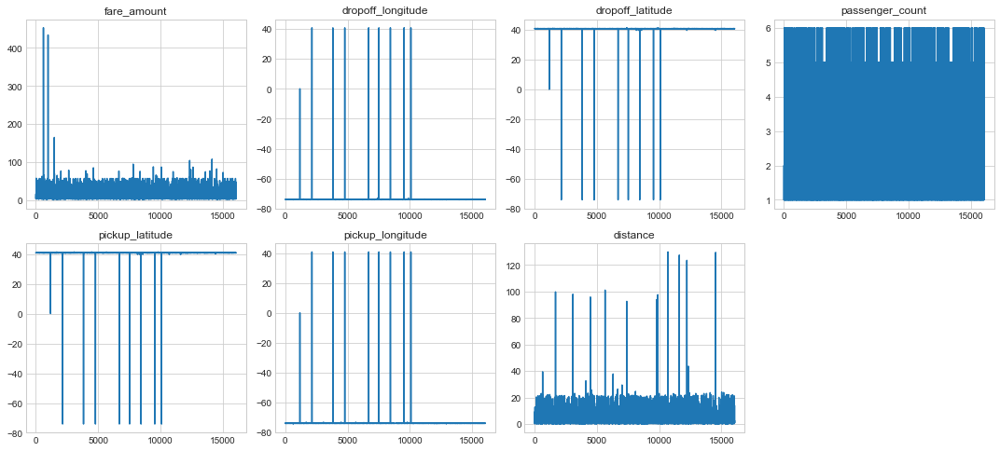

In [128]:
#UNIVARIATE ANALYSIS
fig_size = plt.rcParams['figure.figsize']
fig_size[0] = 15
fig_size[1] = 10

plt.subplot(3,4,1)
plt.plot(train['fare_amount'])
plt.title('fare_amount')

plt.subplot(3,4,2)
plt.plot(train['dropoff_longitude'])
plt.title('dropoff_longitude')

plt.subplot(3,4,3)
plt.plot(train['dropoff_latitude'])
plt.title('dropoff_latitude')

plt.subplot(3,4,4)
plt.plot(train['passenger_count'])
plt.title('passenger_count')

plt.subplot(3,4,5)
plt.plot(train['pickup_latitude'])
plt.title('pickup_latitude')

plt.subplot(3,4,6)
plt.plot(train['pickup_longitude'])
plt.title('pickup_longitude')


plt.subplot(3,4,7)
plt.plot(train['distance'])
plt.title('distance')

plt.tight_layout()

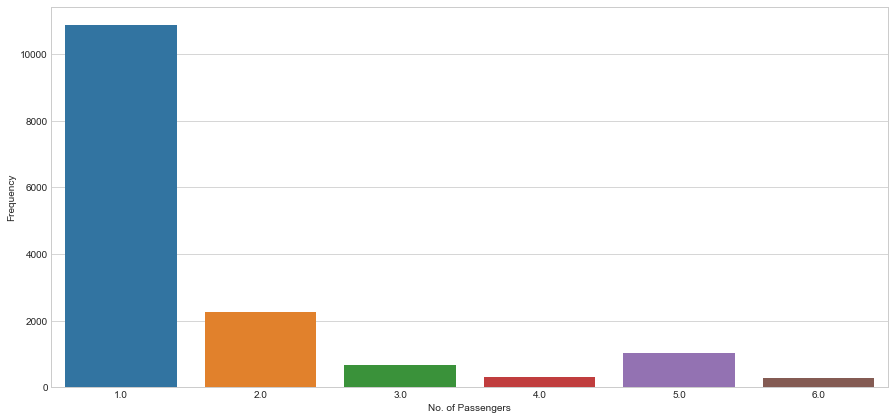

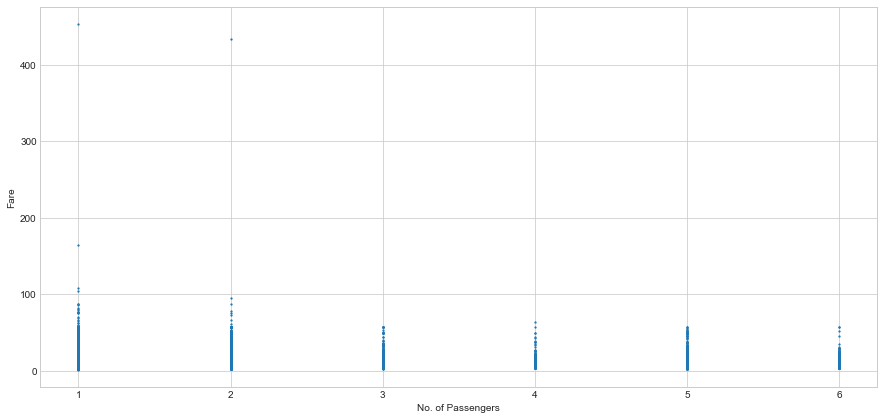

In [129]:
#Bivariate Analysis bewtween 'Passenger_count' and 'fare_amount'

plt.figure(figsize=(15,7))
# plt.hist(train['passenger_count'], bins=15)
sns.countplot(train['passenger_count'])
plt.xlabel('No. of Passengers')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(15,7))
plt.scatter(x=train['passenger_count'], y=train['fare_amount'], s=1.5)
plt.xlabel('No. of Passengers')
plt.ylabel('Fare')
plt.show()

From the above 2 graphs we can see that single passengers are the most frequent travellers, and the highest fare also seems to come from cabs which carry just 1 passenger.

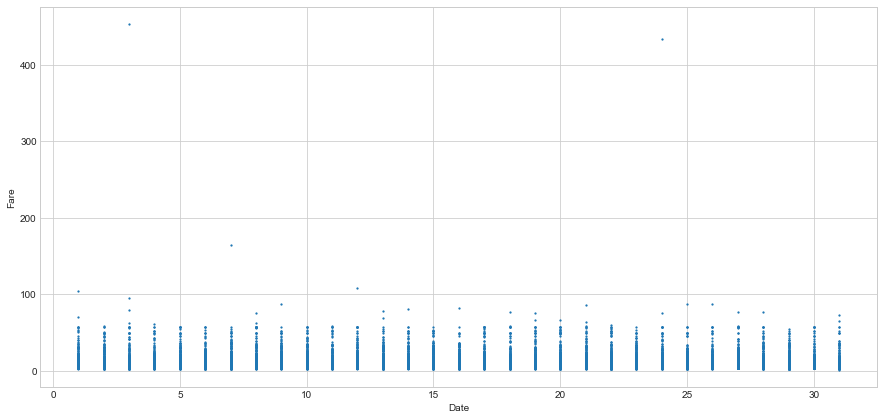

In [130]:
#Bivariate Analysis between 'fare_amount' and 'date'
plt.figure(figsize=(15,7))
plt.scatter(x=train['Date'], y=train['fare_amount'], s=1.5)
plt.xlabel('Date')
plt.ylabel('Fare')
plt.show()



The fares recieved through out the month mostly seem uniform.

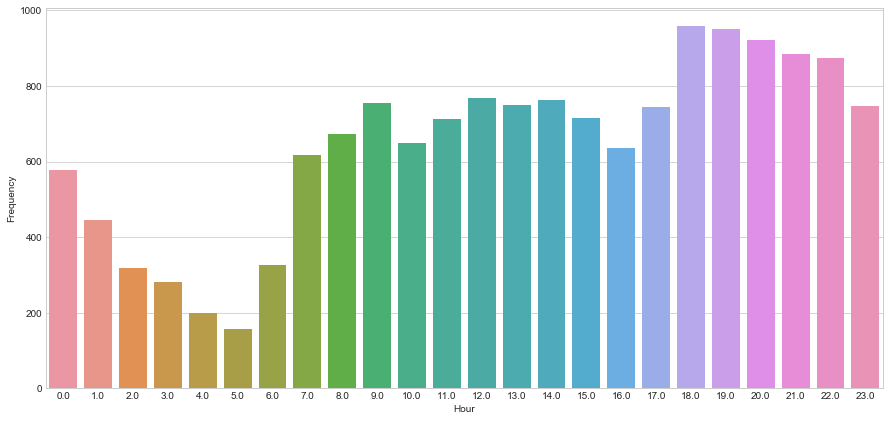

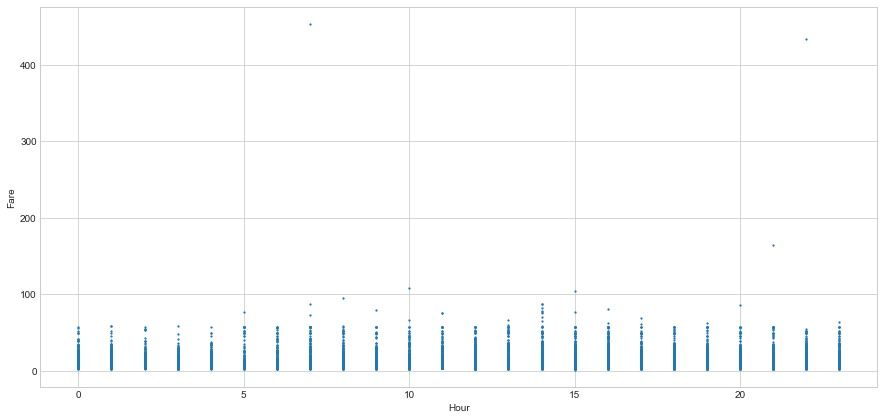

In [131]:
## Bivariate Analysis between 'fare_amount' and 'hour'
plt.figure(figsize=(15,7))
# plt.hist(train['Hour'], bins=100)
sns.countplot(train["Hour"])
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(15,7))
plt.scatter(x=train['Hour'], y=train['fare_amount'], s=1.5)
plt.xlabel('Hour')
plt.ylabel('Fare')
plt.show()

* Well!! It seems that the time of the day plays a profound role in the frequency of cab rides. The lowest being at 5:am and highest being at the Evening 6:00pm
* The highest fare receive at 7 am and 10pm. Other than, fare rate seems to high between 7am to 10am

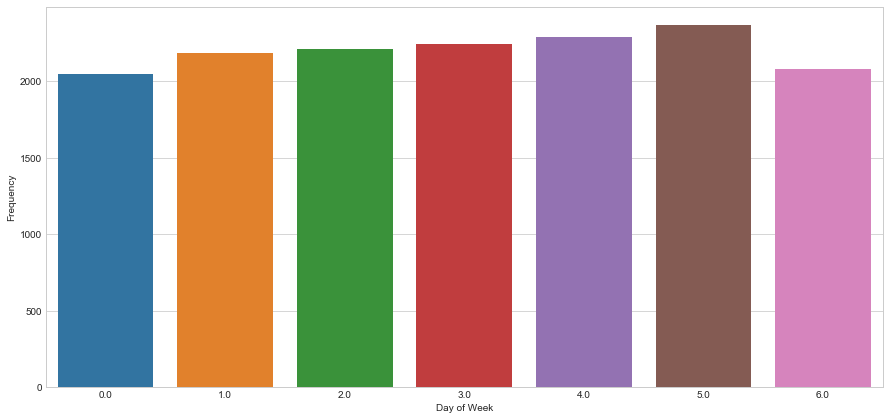

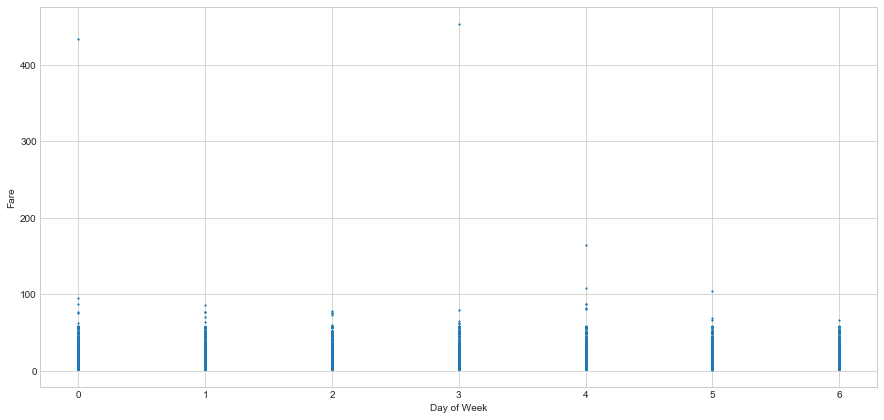

In [132]:
## Bivariate Analysis between 'fare_amount' and 'day of the week'

plt.figure(figsize=(15,7))
# plt.hist(train['Day of Week'], bins=100)
sns.countplot(train["Day_of_Week"])
plt.xlabel('Day of Week')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(15,7))
plt.scatter(x=train['Day_of_Week'], y=train['fare_amount'], s=1.5)
plt.xlabel('Day of Week')
plt.ylabel('Fare')
plt.show()

* Day of the week doesn't seem to have that much of an influence on the number of cab rides. Mostly saturday have maximum number of ride
* The fares through out the Day of week mostly seem uniform, with the maximum fare received on friday and saturday

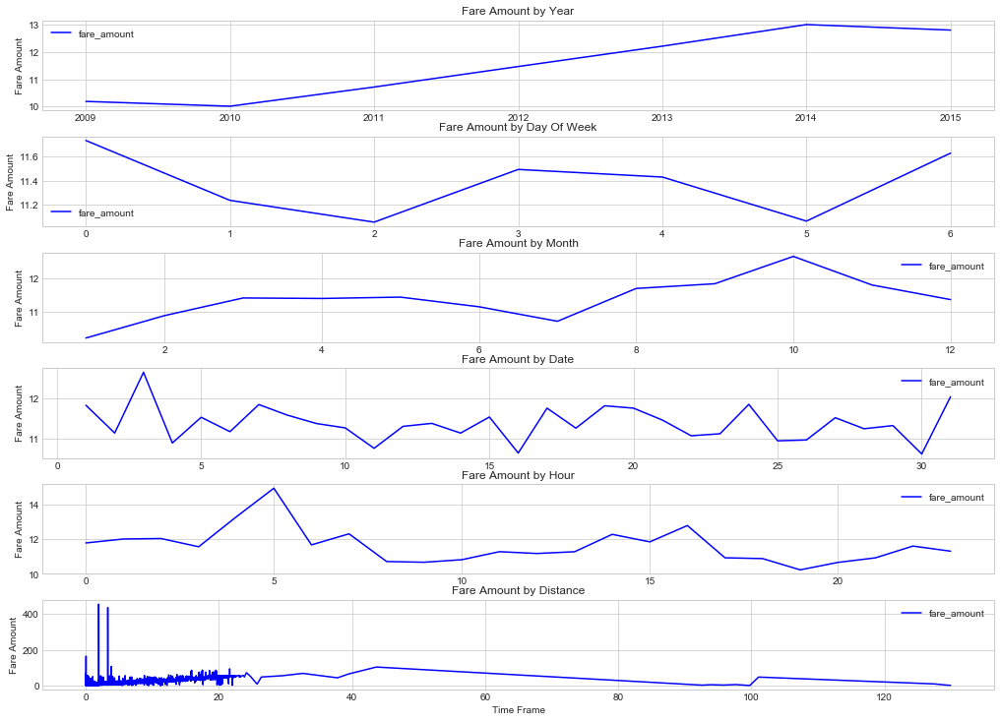

In [133]:
##Function to analyse the trends in 'fare_amouunt'  with respect to different time frames

def time_slicer(df, timeframes, value, color="purple"):
    """
    Function to count observation occurrence through different lenses of time.
    """
    f, ax = plt.subplots(len(timeframes), figsize = [14,10])
    for i,x in enumerate(timeframes):
        df.loc[:,[x,value]].groupby([x]).mean().plot(ax=ax[i],color=color)
        ax[i].set_ylabel(value.replace("_", " ").title())
        ax[i].set_title("{} by {}".format(value.replace("_", " ").title(), x.replace("_", " ").title()))
        ax[i].set_xlabel("")
    ax[len(timeframes)-1].set_xlabel("Time Frame")
    plt.tight_layout(pad=0)
    plt.show()
    
time_slicer(train, ['Year',"Day_of_Week", "Month", "Date", "Hour",'distance'], "fare_amount", "blue")

# OUTLIER ANALYSIS

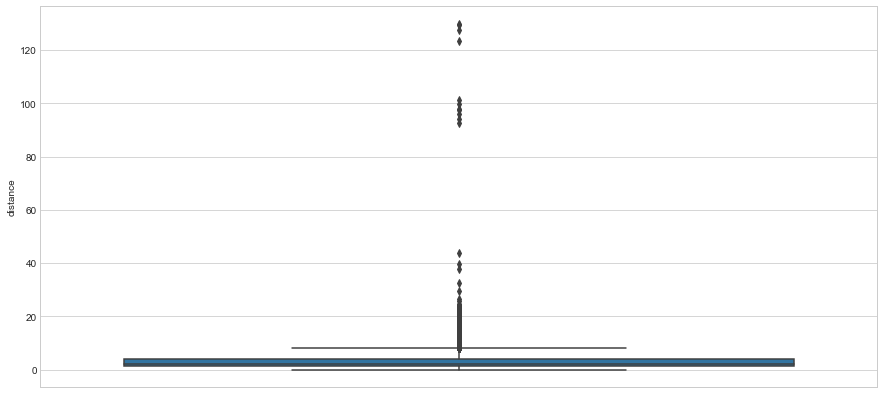

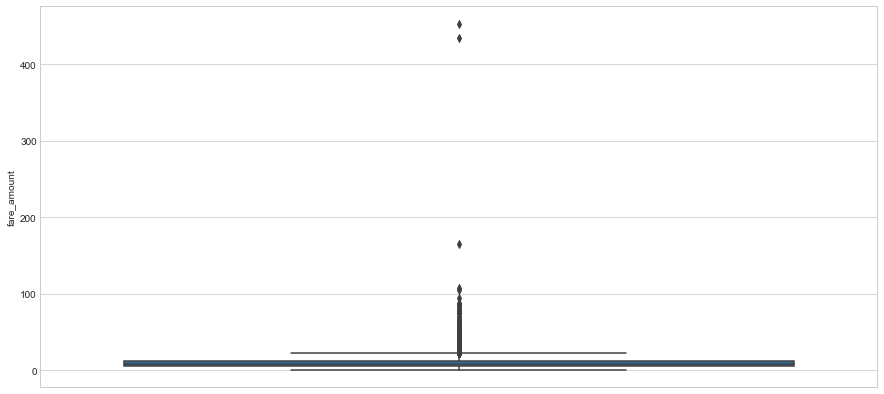

In [134]:
##Boxplot to analyse outliers in 'distance' & 'fare_amount' respectively

plt.figure(figsize=(15,7))
sns.boxplot(train['distance'],orient= "v")
plt.show()

plt.figure(figsize=(15,7))
sns.boxplot(train['fare_amount'],orient= "v")
plt.show()

In [135]:
#Removing the outliers from the variables

df = train.copy()
cnames = ['distance','fare_amount']

for i in cnames:
    q75,q25 = np.percentile(df.loc[:,i],[75,25])
    iqr = q75 - q25
    
    minimum = q25 - (iqr*1.5)
    maximum = q75 + (iqr *1.5)
    
    train = train.drop( train[train.loc[:, i] <minimum ] .index)    
    train = train.drop( train[ train.loc[:,i] > maximum].index)

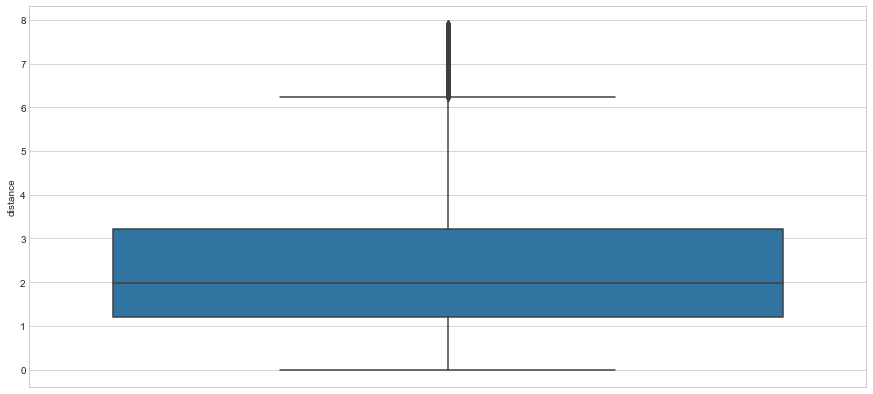

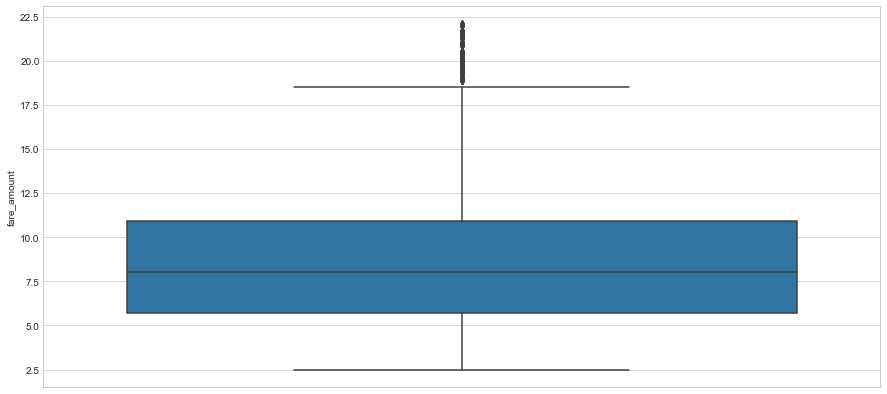

In [136]:
##Boxplots after the removal of outliers

plt.figure(figsize=(15,7))
sns.boxplot(train['distance'],orient= "v")
plt.show()

plt.figure(figsize=(15,7))
sns.boxplot(train['fare_amount'],orient= "v")
plt.show()

In [137]:
##Changing the data types

def convert_data_types(df):

    df['Year'] = df['Year'].astype('object')
    df['Month'] = df['Month'].astype('object')
    df['Date'] = df['Date'].astype('object')
    df['Day_of_Week'] = df['Day_of_Week'].astype('object')
    df['Hour'] = df['Hour'].astype('object')
    return df

train = convert_data_types(train)
test = convert_data_types(test)

# FEATURE SELECTION

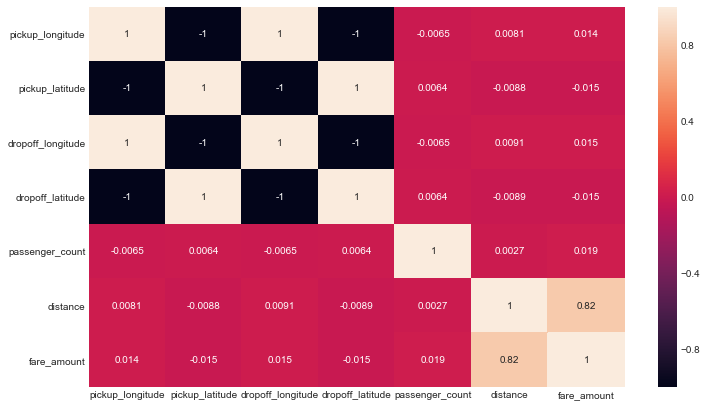

In [139]:
##Constructing a correlation plot
numeric_names = ['pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'distance','fare_amount']
df_corr = train.loc[:,numeric_names]
f,ax = plt.subplots( figsize = (12,7))
sns.heatmap( df_corr.corr(),annot= True )
plt.show()

In [140]:
#dropping the redundant variables

train_feature_selection = train.drop(['pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude'],axis = 1)
# df_feature_selection.shape
# train_feature_selection.to_csv("cab_final.csv",index = False)
train_feature_selection.iloc[:,1:].head()

,passenger_count,Year,Month,Date,Day_of_Week,Hour,distance
0,1.0,2009,6,15,0,17,1.030764
2,2.0,2011,8,18,3,0,1.389525
3,1.0,2012,4,21,5,4,2.799270
4,1.0,2010,3,9,1,7,1.999157
5,1.0,2011,1,6,3,9,3.787239


## FEATURE SCALING

In [141]:
##Function to normalize the 'distance' variable
def feature_distance(data):
    return ( data['distance'] - min(data['distance']) ) / (max(data['distance']) - min( data['distance']))

train['distance']= feature_distance(train)
test['distance']= feature_distance(test)

# MODELLING & EVALUATION

In [143]:
#SPLITTING THE TRAIN DATA IN TO trained and test cases respectively
X_train, X_test, y_train, y_test = train_test_split(train_feature_selection.iloc[:,1:],train_feature_selection['fare_amount'],
                                                    test_size=0.4)


In [144]:
#EVALUATION METRICS

def RMSE(y_actual, y_predict, Train = True):
    
    mape = np.mean(np.abs((y_actual - y_predict) / y_predict))*100
    if Train:
        print(" Trained Model performance:  ")
  
    else:
        print(" Predicted Model performance:  ")
    print(" MAPE: \t",mape)
# print(" MSE: \t",mean_squared_error(y_actual, y_predict))    
    print("RMSE: \t", np.sqrt(mean_squared_error(y_actual, y_predict)))
    print(" r^2 : \t", explained_variance_score(y_actual, y_predict))

## Linear Regression

In [145]:
linear_regression_model = LinearRegression().fit(X_train,y_train)


print (linear_regression_model.intercept_)
# print(linear_regression_model.coef_ )
 
# Lets print the summary model
summary_LR_Model = pd.DataFrame(linear_regression_model.coef_,X_train.columns,columns=['coeff'])
print(summary_LR_Model)

-751.4438187177466
                    coeff
passenger_count  0.044714
Year             0.375221
Month            0.046909
Date             0.001993
Day_of_Week     -0.017266
Hour             0.009856
distance         2.041556


In [146]:
predict_LR_train = linear_regression_model.predict(X_train)
RMSE(y_train,predict_LR_train)

print()
predict_LR = linear_regression_model.predict(X_test)
RMSE(y_test,predict_LR,False)


 Trained Model performance:  
 MAPE: 	 18.471688147355607
RMSE: 	 2.151842010099831
 r^2 : 	 0.708455887632198

 Predicted Model performance:  
 MAPE: 	 18.473227429637124
RMSE: 	 2.1497936717146127
 r^2 : 	 0.699283589629222


## Decision Tree Regressor

In [147]:
# DT = DecisionTreeRegressor(max_depth=10,min_samples_split=9,max_leaf_nodes=49)
DT = DecisionTreeRegressor()
DT.fit(X_train,y_train)


DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [148]:
predict_DT_train = DT.predict(X_train)
RMSE(y_train,predict_DT_train)

print()

predictions_DT = DT.predict(X_test)
RMSE(y_test,predictions_DT,False)


 Trained Model performance:  
 MAPE: 	 1.3016180452035179e-16
RMSE: 	 9.093832713105023e-17
 r^2 : 	 1.0

 Predicted Model performance:  
 MAPE: 	 24.744190932612618
RMSE: 	 2.975473881918177
 r^2 : 	 0.42524329077308776


In [149]:
##Overfitting and Grid search

params = {'max_leaf_nodes': list(range(2,20)),
         'min_samples_split': list(range(2,10)),
         'max_depth': list(range(2,10))}

gs_CV_DT = GridSearchCV(DecisionTreeRegressor(random_state =42),params,n_jobs=1, verbose= 1)

gs_CV_DT.fit(X_train,y_train)

print(gs_CV_DT.best_estimator_)

Fitting 3 folds for each of 1152 candidates, totalling 3456 fits
DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=None,
           max_leaf_nodes=19, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=42, splitter='best')


[Parallel(n_jobs=1)]: Done 3456 out of 3456 | elapsed:  2.9min finished


In [150]:
predict_DT_train = gs_CV_DT.predict(X_train)
RMSE(y_train,predict_DT_train)
print()

predict_GS = gs_CV_DT.predict(X_test)

RMSE(y_test,predict_GS,False)

 Trained Model performance:  
 MAPE: 	 18.292810939342363
RMSE: 	 2.1315655981124744
 r^2 : 	 0.7139243348194748

 Predicted Model performance:  
 MAPE: 	 18.37459540458356
RMSE: 	 2.1533969156258377
 r^2 : 	 0.6982227712771939


## Random Forest

In [151]:
RF_model = RandomForestRegressor(n_estimators=500, random_state= 43 ).fit(X_train,y_train)

print(RF_model)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
           oob_score=False, random_state=43, verbose=0, warm_start=False)


In [152]:
# Predict the model using predict funtion
RF_predict_train = RF_model.predict(X_train)
RMSE(y_train,RF_predict_train)

print()

RF_predict= RF_model.predict(X_test)
RMSE(y_test,RF_predict,False)

 Trained Model performance:  
 MAPE: 	 6.675012443734922
RMSE: 	 0.7975777758759034
 r^2 : 	 0.96004210757797

 Predicted Model performance:  
 MAPE: 	 17.78119346698338
RMSE: 	 2.1066562197157066
 r^2 : 	 0.71261818603809


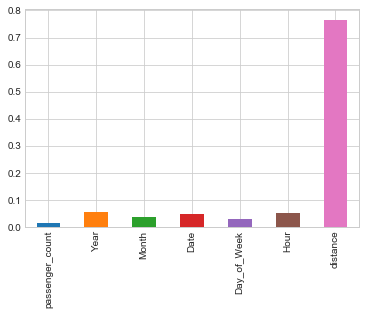

In [153]:
#Printing Feature importance of the model

feat_importances = pd.Series(RF_model.feature_importances_, index=X_train.columns)
feat_importances.plot(kind='bar')

## Gradient Boost Regressor

In [154]:
GBR = GradientBoostingRegressor().fit(X_train,y_train)
print(GBR)

predict_GBR_train = GBR.predict(X_train)
RMSE(y_train, predict_GBR_train)

print()
predict_GBR = GBR.predict(X_test)
RMSE(y_test,predict_GBR,False)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=100, presort='auto', random_state=None,
             subsample=1.0, verbose=0, warm_start=False)
 Trained Model performance:  
 MAPE: 	 16.41471028104751
RMSE: 	 1.9471481946344902
 r^2 : 	 0.7612840024799347

 Predicted Model performance:  
 MAPE: 	 16.998136081346374
RMSE: 	 2.0269200170388837
 r^2 : 	 0.7326968594209937


In [155]:
##Gradiendt Boost Regressor with GridSearchCV 

params = {
         'max_depth': list(range(2,20,2)),
          'min_samples_split' :list(range(5,10)),
    'max_leaf_nodes': list(range(5,10))}

gs_CV_GBR = GridSearchCV(GradientBoostingRegressor(random_state =42),params,n_jobs=1, verbose= 1, cv =5)

gs_CV_GBR.fit(X_train,y_train)


Fitting 5 folds for each of 225 candidates, totalling 1125 fits


[Parallel(n_jobs=1)]: Done 1125 out of 1125 | elapsed: 12.2min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=100, presort='auto', random_state=42,
             subsample=1.0, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18], 'min_samples_split': [5, 6, 7, 8, 9], 'max_leaf_nodes': [5, 6, 7, 8, 9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [156]:
predict_GBR_CV_train = gs_CV_GBR.predict(X_train)
RMSE(y_train, predict_GBR_CV_train)

print()
predict_GBR_CV = gs_CV_GBR.predict(X_test)
RMSE(y_test,predict_GBR_CV,False)

 Trained Model performance:  
 MAPE: 	 16.1847701652791
RMSE: 	 1.8941478656358763
 r^2 : 	 0.7741025807015662

 Predicted Model performance:  
 MAPE: 	 16.877420712443538
RMSE: 	 2.0230598342125035
 r^2 : 	 0.7337316185682679


Compare to all other model, gradient boost model has 83.23% accuracy and RMSE is 2.02 and r^2 is 0.74. Hence, Gradient boost is best model for cab fare prediction

In [157]:
#dropping the redundant variables from test dataset 
test = test.drop(['pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude'],axis = 1)


In [158]:
test.head(5)

,passenger_count,Year,Month,Date,Day_of_Week,Hour,distance
0,1.0,2015,1,27,1,13,0.023219
1,1.0,2015,1,27,1,13,0.024240
2,1.0,2011,10,8,5,11,0.006172
3,1.0,2012,12,1,5,21,0.019597
4,1.0,2012,12,1,5,21,0.053861


In [159]:
##Cab fare prediction for test data using the Gradient Boost model
test['fare_amount'] = GBR.predict(test)


In [161]:
test.to_csv('cabFarePredictionspython.csv', index=False) ##converting into a csv file

Text(0.5,1,'fare_amount')

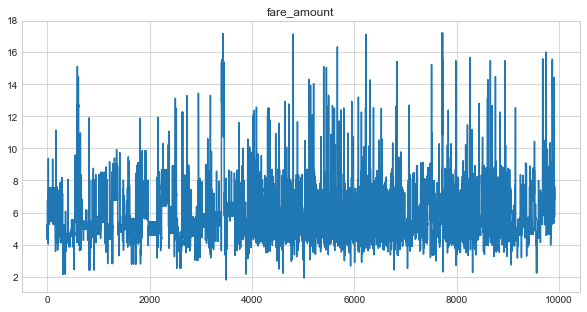

In [162]:
##graph to analyse the predicted output of fare_amount in the test dataset

fig_size = plt.rcParams['figure.figsize']
fig_size[0] = 10
fig_size[1] = 5
plt.plot(test['fare_amount'])
plt.title('fare_amount')